In [1]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from math import sqrt
import seaborn as sns
import numpy as np
from tslearn.metrics import dtw
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import ward, dendrogram, fcluster, single, average, complete
from scipy.stats import spearmanr
from scipy.spatial.distance import pdist, squareform
from scipy.spatial.distance import euclidean
import networkx as nx

# 1. Loading in the Data and Basic Analysis

## 1.1 Data Preprocessing

Load in the ETF return data and index return data

In [2]:
ETF_data = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-ETFRetNEWERdates.csv", index_col=0)

Index_data = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-index_data.csv",index_col=0)

In [3]:
ETF_data.tail()

,ANGL,AOA,AOK,AOM,AOR,ASHR,BAB,BBH,BIL,BIV,...,XLY,XME,XMLV,XOP,XPH,XRT,XSD,XSLV,XTN,ZROZ
2020-04-01,0.039342,-0.009836,0.003925,0.000295,-0.004023,-0.036260,0.003270,0.026008,-0.007661,0.008965,...,-0.045369,-0.033749,0.005904,-0.101279,0.014548,-0.080613,-0.045740,-0.005204,-0.087854,0.029114
2020-04-08,0.047920,0.082964,0.040419,0.048054,0.062843,0.061844,0.038214,0.095140,0.009623,0.014833,...,0.129365,0.111403,0.122347,0.343638,0.093997,0.166562,0.158091,0.096242,0.117873,0.000741
2020-04-15,0.051029,0.001320,0.005950,0.003265,0.002997,-0.014426,0.024061,0.019808,-0.004752,0.015044,...,0.029439,0.010119,-0.019038,-0.028850,0.020767,0.016456,0.004551,-0.023244,-0.016637,0.021388
2020-04-22,-0.014878,0.014925,0.007998,0.012831,0.014134,0.028546,0.015500,0.075722,0.007998,0.005898,...,0.026783,0.018842,-0.014022,0.121053,0.026635,0.015008,0.022715,-0.012624,-0.012983,0.024358
2020-04-29,0.009073,0.039640,0.012736,0.017445,0.027940,0.010378,-0.002526,0.004532,-0.004828,-0.001331,...,0.057661,0.127985,0.079991,0.193138,0.084604,0.133365,0.105155,0.142650,0.131322,-0.011338


In [4]:
Index_data.tail(5)

,AsiaSMALL LoBO,AsiaME1 BO2,AsiaME1 BO3,AsiaME1 BO4,AsiaSMALL HiBO,AsiaME2 BO1,AsiaME2 BO2,AsiaME2 BO3,AsiaME2 BO4,AsiaME2 BO5,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
,,,,,,,,,,,,,,,,,,,,,
2019-12-04,-0.013340,-0.003252,0.003539,-0.011960,-0.010497,-0.019356,0.002167,-0.017582,-0.005644,-0.009438,...,-0.023567,-0.014306,-0.018952,-0.021241,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-11,-0.008032,0.002023,-0.009880,0.003412,0.004531,-0.005038,-0.001529,0.009644,-0.002048,-0.000963,...,-0.000262,0.009499,0.002612,0.010527,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-18,0.012140,0.015043,0.016649,0.017383,0.005285,0.010156,0.018426,0.021130,0.018428,0.022175,...,0.027315,0.019196,0.010113,0.008595,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-25,0.008918,0.013354,0.014367,0.000291,0.014436,0.006811,0.014440,0.017171,0.014573,0.015373,...,0.004890,0.010268,0.005190,0.009818,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01,0.011569,0.005836,-0.002144,0.009836,0.004933,0.013756,0.002525,0.000334,0.004925,0.004526,...,-0.008795,-0.004644,-0.011985,-0.008804,NaN,NaN,NaN,NaN,NaN,NaN


The indexes are objects and we need to change them to daytime

In [5]:
ETF_data.index = pd.to_datetime(ETF_data.index, dayfirst = True)

In [6]:
Index_data.index = pd.to_datetime(Index_data.index, dayfirst=True)

Now we can join the two dataframes on the index of the ETF dataframe.

In [7]:
joined = ETF_data.join(Index_data)

In [8]:
joined

,ANGL,AOA,AOK,AOM,AOR,ASHR,BAB,BBH,BIL,BIV,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
2014-09-24,0.002812,-0.004842,0.005850,0.004202,-3.813270e-08,0.026287,0.013656,0.038108,0.006994,0.009539,...,0.007661,-0.008260,0.001517,0.005168,0.003626,-0.000056,0.000381,0.001109,0.003562,0.010203
2014-10-01,0.007270,-0.012619,0.004794,0.000748,-5.233600e-03,0.003514,0.023538,-0.028072,0.012553,0.022177,...,-0.020985,-0.021133,-0.016002,-0.012500,0.002894,-0.000056,0.000489,0.001491,0.003176,0.007490
2014-10-08,-0.000968,-0.001163,-0.003957,-0.003614,2.232379e-04,0.018744,-0.001835,0.003348,-0.009030,-0.000965,...,-0.000254,-0.004398,0.001961,0.005572,0.001167,-0.000336,0.000077,0.000938,0.002085,0.002663
2014-10-15,-0.028931,-0.044180,-0.022106,-0.026584,-3.477765e-02,-0.025064,0.003597,-0.078044,-0.008274,0.001016,...,-0.052006,-0.056164,-0.062589,-0.042066,-0.004158,-0.001175,-0.003055,-0.004442,-0.004556,-0.006895
2014-10-22,0.038070,0.039399,0.024269,0.028430,3.357497e-02,0.001784,0.005373,0.102960,0.014983,0.009690,...,0.063258,0.076020,0.035589,0.041156,-0.001280,-0.000168,-0.000117,-0.000121,-0.000945,-0.003821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-01,0.039342,-0.009836,0.003925,0.000295,-4.023450e-03,-0.036260,0.003270,0.026008,-0.007661,0.008965,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-08,0.047920,0.082964,0.040419,0.048054,6.284270e-02,0.061844,0.038214,0.095140,0.009623,0.014833,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-15,0.051029,0.001320,0.005950,0.003265,2.997190e-03,-0.014426,0.024061,0.019808,-0.004752,0.015044,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-22,-0.014878,0.014925,0.007998,0.012831,1.413391e-02,0.028546,0.015500,0.075722,0.007998,0.005898,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
joined.index.dtype

dtype('<M8[ns]')

We only have the index data until the 2019-04-10 so we need to cut the end of the dataframe.

In [10]:
enddate = "04-11-2019" 

joined = joined[joined.index < enddate]

joined.tail()

,ANGL,AOA,AOK,AOM,AOR,ASHR,BAB,BBH,BIL,BIV,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
2019-03-13,-0.000617,0.006665,0.003033,0.005002,0.006041,-0.032574,0.004032,0.031632,-0.001123,0.004032,...,0.018714,-0.002824,-0.001776,0.022301,-0.000839,-0.000167,-0.000460,-0.000675,-0.000740,-0.001616
2019-03-20,-0.001074,-0.000407,0.000162,0.000214,-0.001426,0.022585,-0.003883,-0.012407,-0.007473,-0.001096,...,-0.016113,-0.024386,-0.011934,-0.006389,0.008319,0.000222,0.001439,0.003326,0.007220,0.020606
2019-03-27,0.014981,0.008535,0.016752,0.014981,0.012026,-0.020018,0.031247,-0.020677,0.015535,0.024239,...,-0.000718,0.004927,-0.008209,0.003505,0.000740,0.000222,0.000839,0.001018,0.000942,0.000760
2019-04-03,0.007966,0.019795,0.004954,0.008053,0.013855,0.083112,-0.010384,0.045146,0.001184,-0.005459,...,0.018245,0.040046,0.052647,0.019539,-0.002148,-0.000666,-0.001088,-0.001379,-0.002429,-0.003900
2019-04-10,0.004224,0.000103,0.000641,0.000528,0.000815,0.008223,0.002888,0.002351,-0.002967,0.001022,...,0.004748,0.001318,0.003198,-0.011486,-0.000404,0.000333,0.000638,0.000984,0.000106,-0.002371


**Calculate the spearman correlation of between the indexes.**

In [11]:
corr = joined.corr(method="spearman")

In [12]:
corr

,ANGL,AOA,AOK,AOM,AOR,ASHR,BAB,BBH,BIL,BIV,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
ANGL,1.000000,0.737177,0.834013,0.826299,0.792049,0.252170,0.549897,0.422659,0.734459,0.661748,...,0.640515,0.549459,0.611451,0.670163,0.066401,0.015965,0.038242,0.059884,0.055602,0.071638
AOA,0.737177,1.000000,0.832187,0.901995,0.970197,0.442691,0.333148,0.675840,0.561353,0.440468,...,0.823387,0.776401,0.839331,0.829230,0.038630,0.029895,0.033956,0.050453,0.040494,0.036680
AOK,0.834013,0.832187,1.000000,0.976521,0.918757,0.344805,0.722359,0.556995,0.865636,0.819964,...,0.725109,0.604036,0.653082,0.757375,0.135232,0.110471,0.116217,0.127353,0.130196,0.134936
AOM,0.826299,0.901995,0.976521,1.000000,0.966411,0.385638,0.637444,0.616055,0.805553,0.736059,...,0.774234,0.671299,0.723225,0.797432,0.116217,0.086938,0.097128,0.114314,0.115729,0.113820
AOR,0.792049,0.970197,0.918757,0.966411,1.000000,0.430286,0.484266,0.666000,0.685250,0.589991,...,0.814685,0.738664,0.795649,0.821369,0.070851,0.052960,0.059163,0.076001,0.072956,0.071918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LET1TREU Index,0.015965,0.029895,0.110471,0.086938,0.052960,0.037048,0.157707,-0.017353,0.135881,0.177663,...,0.021675,-0.007599,-0.003942,0.063448,0.687362,1.000000,0.938442,0.846713,0.712196,0.572893
LET3TREU Index,0.038242,0.033956,0.116217,0.097128,0.059163,0.017489,0.180465,-0.016944,0.126354,0.194168,...,0.016442,-0.008702,-0.034884,0.049149,0.823056,0.938442,1.000000,0.963349,0.862531,0.714357
LET5TREU Index,0.059884,0.050453,0.127353,0.114314,0.076001,0.040865,0.195616,-0.001043,0.118991,0.205762,...,0.033820,0.002447,-0.039702,0.051758,0.917213,0.846713,0.963349,1.000000,0.953519,0.829265
LET7TREU Index,0.055602,0.040494,0.130196,0.115729,0.072956,0.041173,0.229287,-0.003822,0.106505,0.219334,...,0.031883,-0.010709,-0.067697,0.032445,0.971940,0.712196,0.862531,0.953519,1.000000,0.923161


Save the upper half diagonal of the matrix

In [13]:
mask = np.triu(np.ones_like(corr, dtype=np.bool))

In [14]:
mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [False,  True,  True, ...,  True,  True,  True],
       [False, False,  True, ...,  True,  True,  True],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ..., False,  True,  True],
       [False, False, False, ..., False, False,  True]])

In [15]:
corr = corr*mask

In [16]:
corr

,ANGL,AOA,AOK,AOM,AOR,ASHR,BAB,BBH,BIL,BIV,...,Insur,RlEst,Fin,Other,LEATTREU Index,LET1TREU Index,LET3TREU Index,LET5TREU Index,LET7TREU Index,LET0TREU Index
ANGL,1.0,0.737177,0.834013,0.826299,0.792049,0.252170,0.549897,0.422659,0.734459,0.661748,...,0.640515,0.549459,0.611451,0.670163,0.066401,0.015965,0.038242,0.059884,0.055602,0.071638
AOA,0.0,1.000000,0.832187,0.901995,0.970197,0.442691,0.333148,0.675840,0.561353,0.440468,...,0.823387,0.776401,0.839331,0.829230,0.038630,0.029895,0.033956,0.050453,0.040494,0.036680
AOK,0.0,0.000000,1.000000,0.976521,0.918757,0.344805,0.722359,0.556995,0.865636,0.819964,...,0.725109,0.604036,0.653082,0.757375,0.135232,0.110471,0.116217,0.127353,0.130196,0.134936
AOM,0.0,0.000000,0.000000,1.000000,0.966411,0.385638,0.637444,0.616055,0.805553,0.736059,...,0.774234,0.671299,0.723225,0.797432,0.116217,0.086938,0.097128,0.114314,0.115729,0.113820
AOR,0.0,0.000000,0.000000,0.000000,1.000000,0.430286,0.484266,0.666000,0.685250,0.589991,...,0.814685,0.738664,0.795649,0.821369,0.070851,0.052960,0.059163,0.076001,0.072956,0.071918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LET1TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,1.000000,0.938442,0.846713,0.712196,0.572893
LET3TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,1.000000,0.963349,0.862531,0.714357
LET5TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,...,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.953519,0.829265
LET7TREU Index,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,...,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.923161


Use the corr matrix to create the links

In [17]:
links = corr.stack().reset_index()


Drop all 0 rows from the matrix.

In [18]:
links = links.replace(0, np.nan)
links = links.dropna(how='any', axis=0)
#df = df.replace(np.nan, 0)

In [19]:
links

,level_0,level_1,0
0,ANGL,ANGL,1.000000
1,ANGL,AOA,0.737177
2,ANGL,AOK,0.834013
3,ANGL,AOM,0.826299
4,ANGL,AOR,0.792049
...,...,...,...
512653,LET5TREU Index,LET7TREU Index,0.953519
512654,LET5TREU Index,LET0TREU Index,0.829265
513370,LET7TREU Index,LET7TREU Index,1.000000
513371,LET7TREU Index,LET0TREU Index,0.923161


Rename the columns

In [20]:
links.columns=["var1", "var2", "value"]

Filter out self correlation links and only keep links where the correlation is larger than 0.5

In [21]:
links_filtered=links.loc[(links["value"]>0.5) & (links["var1"] != links["var2"])]
#links_filtered=links.loc[links["var1"] != links["var2"]]
links_filtered

,var1,var2,value
1,ANGL,AOA,0.737177
2,ANGL,AOK,0.834013
3,ANGL,AOM,0.826299
4,ANGL,AOR,0.792049
6,ANGL,BAB,0.549897
...,...,...,...
511936,LET3TREU Index,LET7TREU Index,0.862531
511937,LET3TREU Index,LET0TREU Index,0.714357
512653,LET5TREU Index,LET7TREU Index,0.953519
512654,LET5TREU Index,LET0TREU Index,0.829265


https://julian-west.github.io/blog/visualising-asset-price-correlations/

**Create a graph were only correlation higher than 0.5 creates links (both negative and positive).**

Add the notes and then add the weighted edges

In [22]:
G = nx.Graph()

for i in range(len(corr)):
    G.add_node(corr.index[i])
    

In [23]:
tuples = list(links_filtered.itertuples(index=False,name=None))
G.add_weighted_edges_from(tuples)


In [24]:
G.number_of_edges()

147487

**Now we want to want to assign color, thichness and nodesize to plot the graph.**

Begin by reading in the cluster data, since we want to color the ETFs blue and indexes red.

In [25]:
cluster_df = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-clusters.csv",index_col=0)

In [26]:
cluster_df["Class"]

ANGL              1.0
AOA               1.0
AOK               1.0
AOM               1.0
AOR               1.0
                 ... 
LET1TREU Index    2.0
LET3TREU Index    2.0
LET5TREU Index    2.0
LET7TREU Index    2.0
LET0TREU Index    2.0
Name: Class, Length: 717, dtype: float64

Now we read in the ETF info to save the assetclass.

In [27]:
ETF_info = pd.read_csv("/Users/a/Dropbox/Thesis/Thesis/Coding/PreprocessedData/out-ETFinfo.csv",index_col=0)

Save it into the cluster_df dataframe

In [28]:
cluster_df["asset class"] = ETF_info["assetClass"]

Now we want to split the indices into bonds, indusrty portfolios and market portfolios

In [29]:
cluster_df["asset class"].iloc[-6:] = "Bonds"

/Users/a/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [30]:
cluster_df["asset class"].iloc[-55:-6] = "Industry Portfolios"

In [31]:
cluster_df["asset class"].iloc[-180:-55] = "Market Portfolios"

Create the color, size and edge lists.

def assign_node_color(classno, assetclass):
    if classno == 1:
        if assetclass == "Equity":
            return "blue" #red
        elif assetclass == "Fixed Income":
            return "cornflowerblue"
        elif assetclass == "Asset Allocation":
            return "lightsteelblue"
        elif assetclass == "Commodities":
            return "slateblue"
        else:
            return "lightsteelblue"
    else:
        if assetclass == "Industry Portfolios":
            return "tomato" 
        elif assetclass == "Market Portfolios":
            return "lightcoral"
        else:
            return "darkred"

In [32]:
def assign_node_color(classno, assetclass):
    if classno == 1:
        return "royalblue" 
    else:
        return "tomato" 

def assign_colour(correlation):
    if correlation <= 0.75:
        return "#8eb7a4"  # dark green
    else:
        return "#cee5db"  # light green

def assign_thickness(correlation, benchmark_thickness=1, scaling_factor=1):
    return benchmark_thickness * abs(correlation)**scaling_factor

def assign_node_size(degree, scaling_factor=30):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for i in range(len(links_filtered)):
    edge_colours.append(assign_colour(links_filtered.iloc[i]["value"]))
    edge_width.append(assign_thickness(links_filtered.iloc[i]["value"]))

# assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(G.degree).items():
    node_size.append(max(2000,assign_node_size(value))/10)
        
    
node_color = []
for i in range(len(cluster_df)):
    node_color.append(assign_node_color(cluster_df["Class"].iloc[i], cluster_df["asset class"].iloc[i]))

And plot the network.
- Only links where the correlation is higher than 0.5 is shown.
- Here the edges are ligtgreen if their correlation is 0.5-0.75, higher darkblue.
- The nodes are sizes after their degree, but the nodes from the blue and green cluster have a minimum size of 10 to make them clearly visible.

/Users/a/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


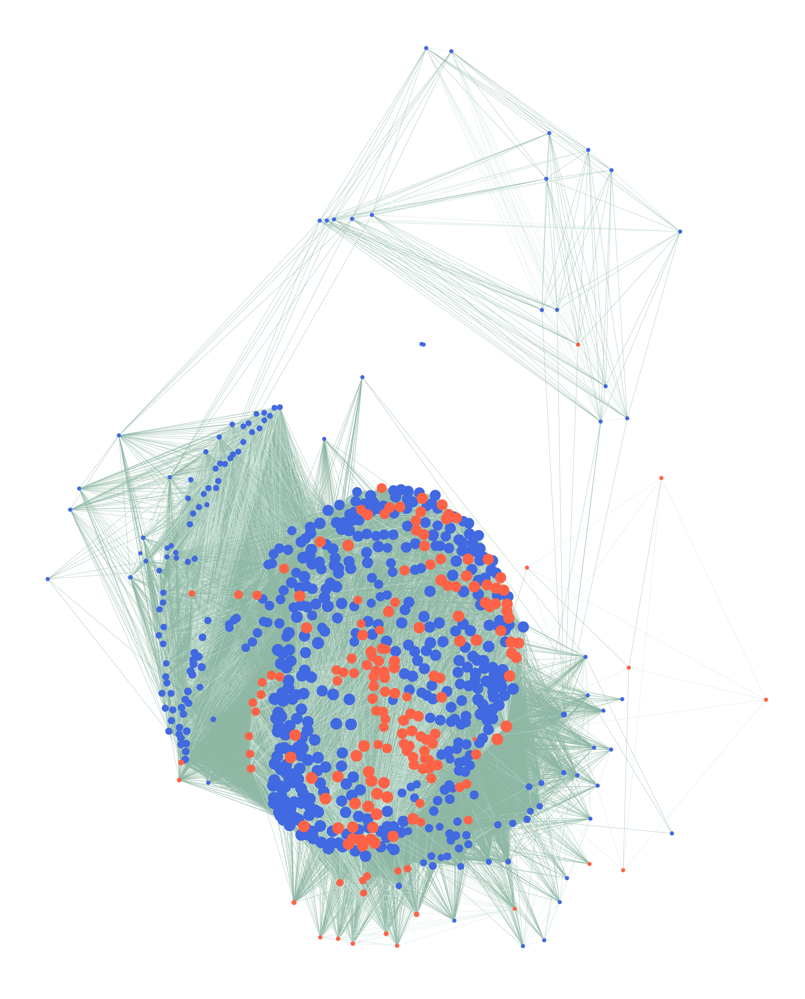

In [33]:
plt.figure(figsize=(40,50))
nx.draw_kamada_kawai(G, with_labels = False, font_size = 17, node_color = node_color, node_size = node_size, edge_color=edge_colours, alpha = 1)
ax = plt.gca()
#plt.savefig("NetworkIndexes.png", dpi=300, bbox_inches='tight')
plt.show()


In [34]:
def assign_node_color(classno, assetclass):
    if classno == 1:
        if assetclass == "Equity":
            return "chartreuse" #red
        elif assetclass == "Fixed Income":
            return "darkorchid"
        elif assetclass == "Commodities":
            return "darkorange"
        else:
            return "gold"
    else:
        return "tomato" 

def assign_colour(correlation):
    if correlation <= 0.75:
        return "#8eb7a4"  # dark green
    else:
        return "#cee5db"  # light green

def assign_thickness(correlation, benchmark_thickness=1, scaling_factor=1):
    return benchmark_thickness * abs(correlation)**scaling_factor

def assign_node_size(degree, scaling_factor=30):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for i in range(len(links_filtered)):
    edge_colours.append(assign_colour(links_filtered.iloc[i]["value"]))
    edge_width.append(assign_thickness(links_filtered.iloc[i]["value"]))

# assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(G.degree).items():
    node_size.append(max(5000,assign_node_size(value))/10)
        
    
node_color = []
for i in range(len(cluster_df)):
    node_color.append(assign_node_color(cluster_df["Class"].iloc[i], cluster_df["asset class"].iloc[i]))

And plot the network.
- Only links where the correlation is higher than 0.5 is shown.
- Here the edges are ligtgreen if their correlation is 0.5-0.75, higher darkblue.
- The nodes are sizes after their degree, but the nodes from the blue and green cluster have a minimum size of 10 to make them clearly visible.

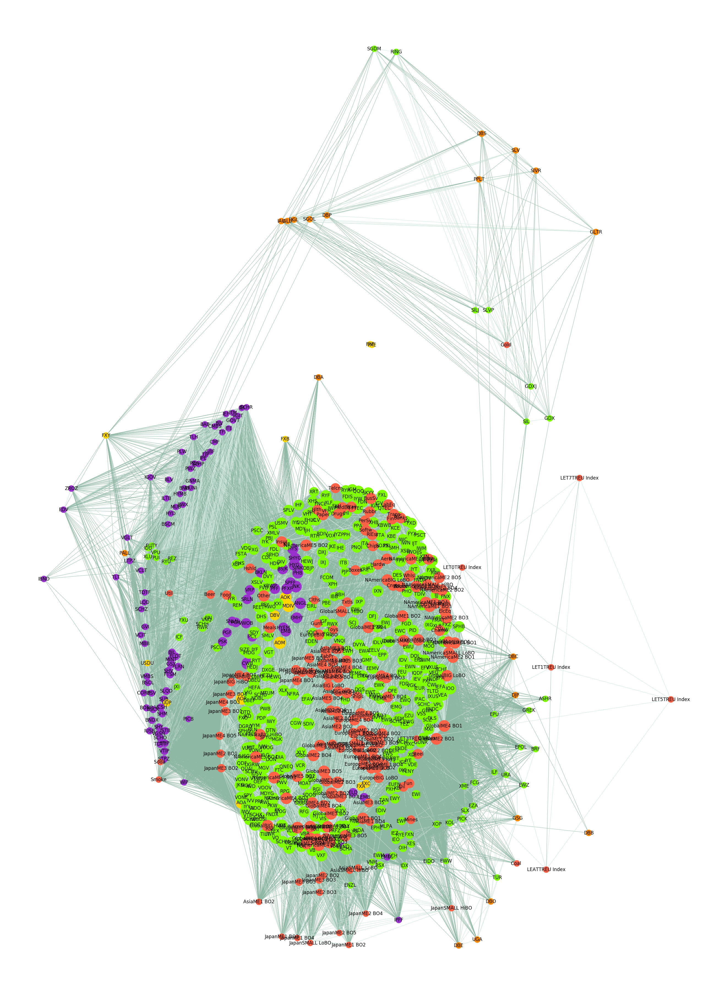

In [35]:
plt.figure(figsize=(35,50))
nx.draw_kamada_kawai(G, with_labels = True, font_size = 17, node_color = node_color, node_size = node_size, edge_color=edge_colours, alpha = 1)
ax = plt.gca()
#plt.savefig("NetworkIndexes.png", dpi=300, bbox_inches='tight')
plt.show()


**Now lets compute the eigenvector centrality, betweeness centarlity and the degree for each of the ETFs.**

In [36]:
#create the dataframe and calculate the degree
df = pd.DataFrame.from_dict(dict(G.degree), orient='index')
df.reset_index(inplace=True)
df.columns = ['ETF','Degree']

#add the betweenness centrality and eigenvector centrality to the dataframe
df["BC"] = list(nx.betweenness_centrality(G).values())
df["EC"] = list(nx.eigenvector_centrality_numpy(G).values())
df


,ETF,Degree,BC,EC
0,ANGL,538,0.002681,4.173098e-02
1,AOA,614,0.002659,4.849252e-02
2,AOK,575,0.007017,4.312131e-02
3,AOM,624,0.006604,4.728111e-02
4,AOR,639,0.004967,4.856953e-02
...,...,...,...,...
712,LET1TREU Index,5,0.000000,6.938894e-18
713,LET3TREU Index,5,0.000000,3.469447e-18
714,LET5TREU Index,5,0.000000,-3.469447e-18
715,LET7TREU Index,5,0.000000,8.673617e-19


Visualize the top and bottom values

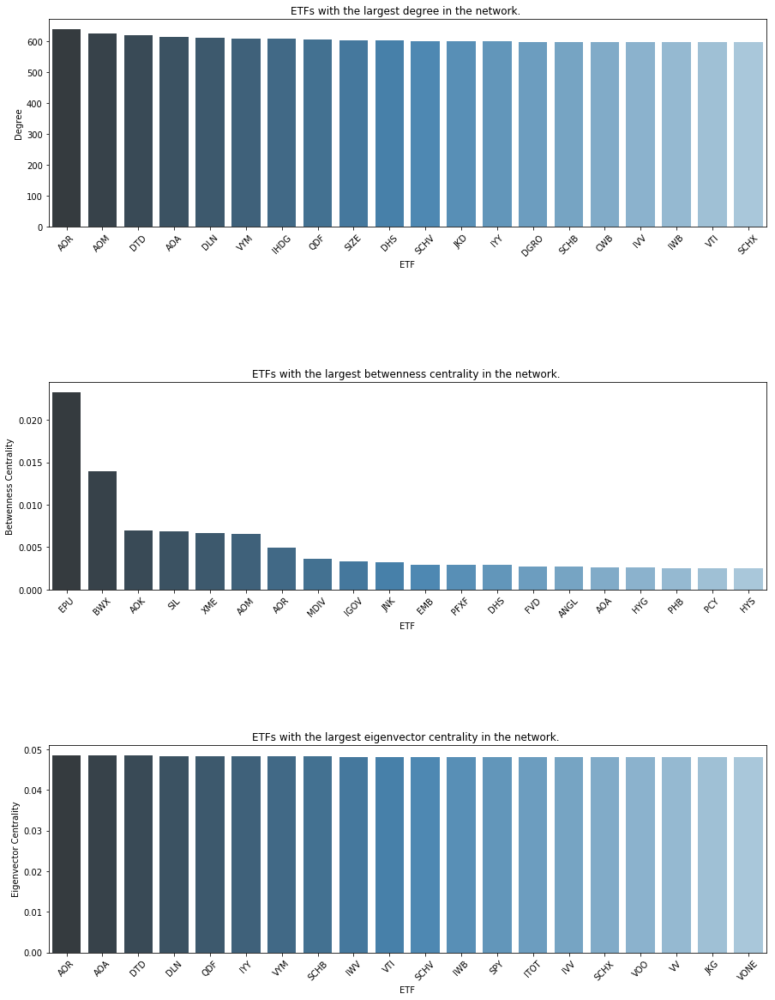

In [37]:
fig = plt.figure(figsize=(15,20))
ax1 = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.75)
                                                                                        
plt.xticks(rotation=45)
sns.barplot(x="ETF",y='Degree',data=df.sort_values(by='Degree',ascending=False).head(20),ax=ax1,palette='Blues_d')
sns.barplot(x="ETF",y='BC',data=df.sort_values(by='BC',ascending=False).head(20),ax=ax2,palette='Blues_d')
sns.barplot(x="ETF",y='EC',data=df.sort_values(by='EC',ascending=False).head(20),ax=ax3,palette='Blues_d')


ax1.set_xticklabels([label for label in df.sort_values(by='Degree',ascending=False).head(20)['ETF']], rotation=45)
ax2.set_xticklabels([label for label in df.sort_values(by='BC',ascending=False).head(20)['ETF']], rotation=45)
ax3.set_xticklabels([label for label in df.sort_values(by='EC',ascending=False).head(20)['ETF']], rotation=45)

ax1.set_title("ETFs with the largest degree in the network. ")
ax2.set_title("ETFs with the largest betwenness centrality in the network. ")
ax3.set_title("ETFs with the largest eigenvector centrality in the network. ")

ax2.set_ylabel("Betwenness Centrality")
ax3.set_ylabel("Eigenvector Centrality")

plt.show()

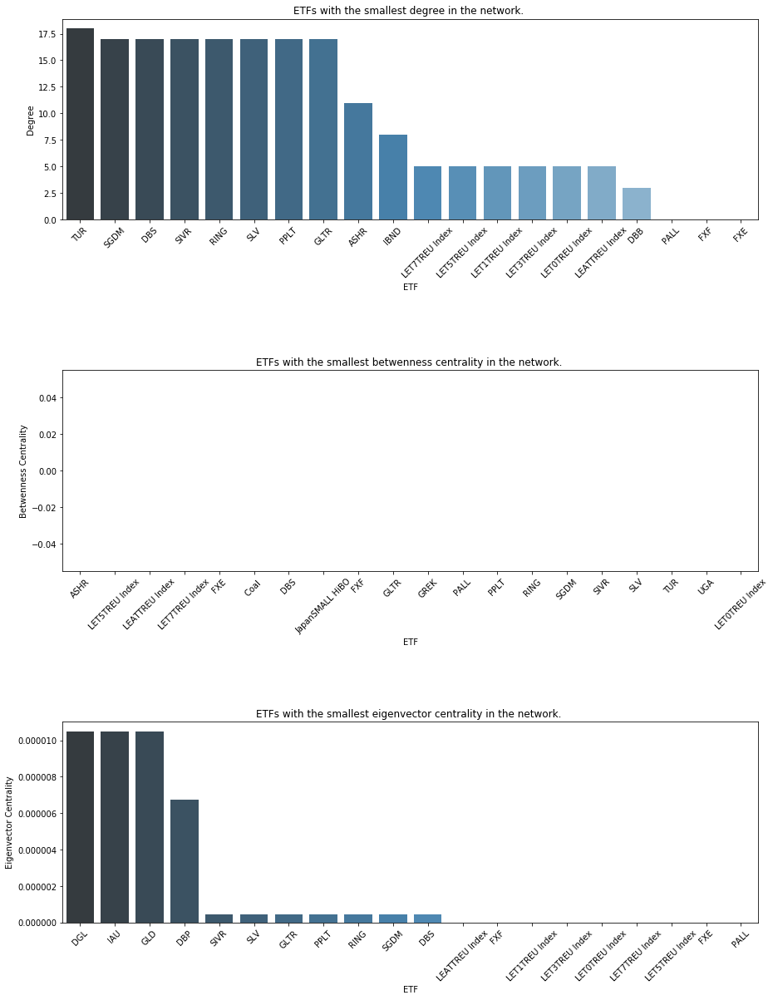

In [38]:
fig = plt.figure(figsize=(15,20))
ax1 = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.75)
                                                                                        
plt.xticks(rotation=45)
sns.barplot(x="ETF",y='Degree',data=df.sort_values(by='Degree',ascending=False).tail(20),ax=ax1,palette='Blues_d')
sns.barplot(x="ETF",y='BC',data=df.sort_values(by='BC',ascending=False).tail(20),ax=ax2,palette='Blues_d')
sns.barplot(x="ETF",y='EC',data=df.sort_values(by='EC',ascending=False).tail(20),ax=ax3,palette='Blues_d')


ax1.set_xticklabels([label for label in df.sort_values(by='Degree',ascending=False).tail(20)['ETF']], rotation=45)
ax2.set_xticklabels([label for label in df.sort_values(by='BC',ascending=False).tail(20)['ETF']], rotation=45)
ax3.set_xticklabels([label for label in df.sort_values(by='EC',ascending=False).tail(20)['ETF']], rotation=45)

ax1.set_title("ETFs with the smallest degree in the network. ")
ax2.set_title("ETFs with the smallest betwenness centrality in the network. ")
ax3.set_title("ETFs with the smallest eigenvector centrality in the network. ")

ax2.set_ylabel("Betwenness Centrality")
ax3.set_ylabel("Eigenvector Centrality")

plt.show()

## Community Detection